In [1]:
! nvidia-smi

Sat Sep  2 12:14:35 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            On   | 00000000:00:1E.0 Off |                    0 |
| N/A   41C    P0    26W /  70W |   9702MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
# %load_ext autoreload
# %autoreload 2

import os
import torch
from skimage import io, measure
import numpy as np
import matplotlib.pyplot as plt

from tifffile import imread, imsave

import warnings
warnings.filterwarnings('ignore')

from tifffile import imread




if not torch.cuda.is_available():
    raise ValueError("GPU not found, code will run on CPU and can be extremely slow!")
else:
    device = torch.device("cuda:0")

import time
from glob import glob
import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint, EarlyStopping
import torch.optim as optim
import torch.utils.data as dt


import sys
sys.path.append('../../gap/')
from GAP_UNET_ResBlock import UN
from BinomDataset import BinomDataset
from inference import sample_image

In [3]:
import os.path as _ospath
import numpy as _np
import yaml as _yaml
import glob as _glob
import h5py as _h5py
import re as _re
import struct as _struct
import json as _json
import os as _os

# Data
The data will be published shortly.
Links will be provided here.
Importantly, pixel values should contain photon counts and images should not be significantly affected by other types of noise.

# Training

### Loading the data
_________________

We load the data. We can use the full dataset for training, since this is self-supervised and we do not require ground truth.

In [9]:
# read in a h5 file
import h5py

import os

file_path = '/home/michaels/GAP/data/untouched.hdf5'

# Check if the file exists
if os.path.exists(file_path):
    # Check file permissions
    if os.access(file_path, os.R_OK):
        print("Read permission is granted for the file.")
    else:
        print("Read permission is not granted for the file.")
else:
    print("File does not exist.")

# Check directory permissions (if applicable)
directory_path = '/home/michaels/GAP/data/'

if os.path.exists(directory_path):
    if os.access(directory_path, os.R_OK):
        print("Read permission is granted for the directory.")
    else:
        print("Read permission is not granted for the directory.")
else:
    print("Directory does not exist.")


Read permission is granted for the file.
Read permission is granted for the directory.


In [10]:
# Might not need
f = h5py.File(file_path, 'r')
list(f.keys())
dset = f['locs']
dset.dtype
dset.name

'/locs'

In [11]:
# Define function to load picasso data

def load_locs(path, qt_parent=None):
    with _h5py.File(path, "r") as locs_file:
        locs = locs_file["locs"][...]
    locs = _np.rec.array(
        locs, dtype=locs.dtype
    )  # Convert to rec array with fields as attributes
    info = load_info(path, qt_parent=qt_parent)
    return locs, info

In [12]:
# Define function to load metadata

def load_info(path, qt_parent=None):
    path_base, path_extension = _ospath.splitext(path)
    filename = path_base + ".yaml"
    try:
        with open(filename, "r") as info_file:
            info = list(_yaml.load_all(info_file, Loader=_yaml.FullLoader))
    except FileNotFoundError as e:
        print("\nAn error occured. Could not find metadata file:\n{}".format(filename))
        if qt_parent is not None:
            _QMessageBox.critical(
                qt_parent,
                "An error occured",
                "Could not find metadata file:\n{}".format(filename),
            )
        raise NoMetadataFileError(e)
    return info

In [13]:
# Load the data returning locals and info which are now part of a record array
locs, info = load_locs(file_path)

In [14]:
locs

rec.array([(    0,   3.1164703, 362.57062, 75469.35 , 2.8187313, 3.5966918, 365.26425, 0.01711771, 0.02408114, 0.21629891, 14109.273),
           (    0,   4.228758 , 353.05896, 40962.06 , 1.9656377, 2.1758657, 889.2222 , 0.01946312, 0.02276495, 0.09661808, 27627.594),
           (    0,   5.43186  , 462.7381 , 19563.994, 2.3273153, 2.3608298, 255.90579, 0.03174936, 0.03243077, 0.01419607, 10312.474),
           ...,
           (24975, 467.70074  , 504.35944, 14569.692, 1.9447422, 2.0474677, 485.9038 , 0.03648549, 0.0396648 , 0.05017198,  9424.63 ),
           (24975, 470.80075  , 457.8904 ,  2990.523, 1.4720968, 1.3681132, 555.12805, 0.09611649, 0.08441085, 0.07063641,  5114.231),
           (24975, 497.04727  , 376.2186 , 11853.493, 2.0740817, 1.9960679, 470.6945 , 0.04771489, 0.04475611, 0.03761365,  8189.797)],
          dtype=[('frame', '<u4'), ('x', '<f4'), ('y', '<f4'), ('photons', '<f4'), ('sx', '<f4'), ('sy', '<f4'), ('bg', '<f4'), ('lpx', '<f4'), ('lpy', '<f4'), ('ellipticity

In [15]:
# Extract specific fields and stack them into a new regular array
x_y_photonsarray = np.column_stack((locs['x'], locs['y'], locs['photons']))


In [16]:
np.max(x_y_photonsarray[:,0])

510.7169

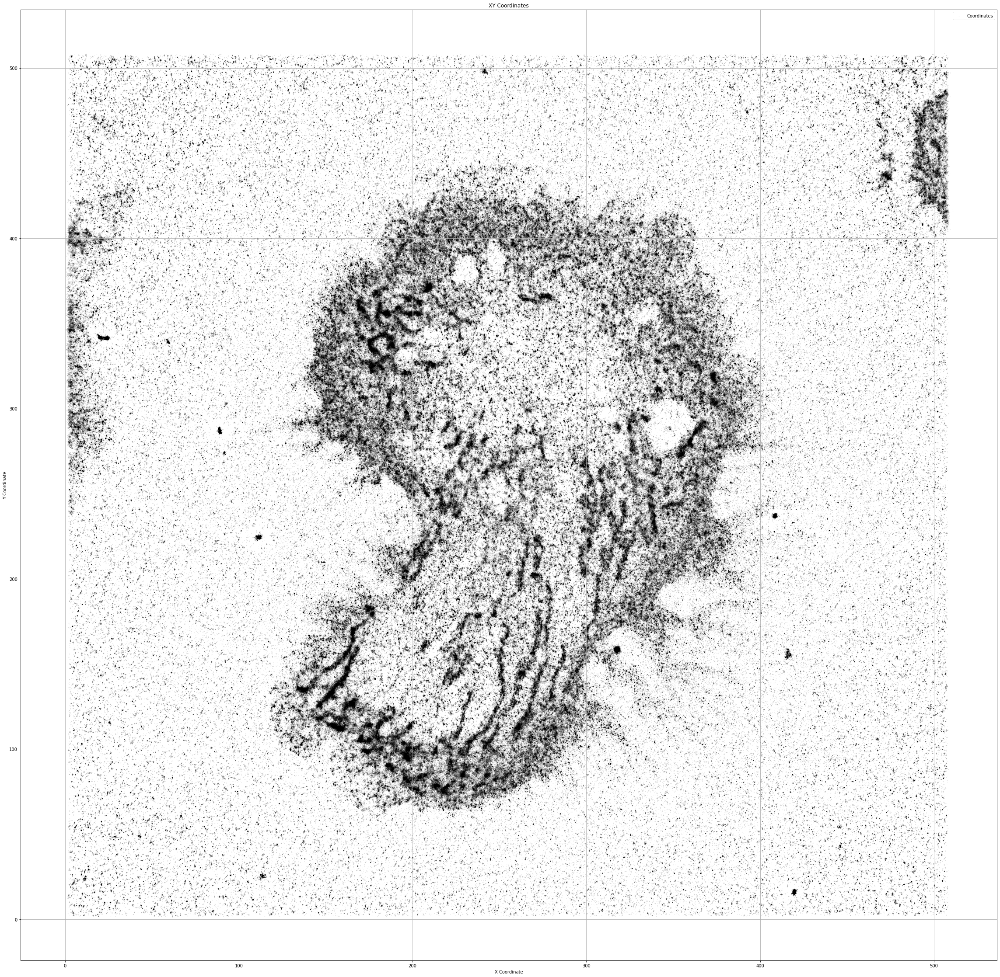

In [17]:
import matplotlib.pyplot as plt

def plot_coordinates(xy_array):
    """
    Plot xy coordinates from the given array.

    Parameters:
    - xy_array: NumPy array with 'x' and 'y' fields.
    """
    # Extract 'x' and 'y' columns from the array
    x = xy_array[:,0]
    y = xy_array[:,1]

    # Create a scatter plot
    plt.figure(figsize=(40 , 40))  # Optional: set the figure size
    plt.scatter(x, y, marker='.', s=0.01, c='k', label='Coordinates')
    
    # Add labels and a legend
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.title('XY Coordinates')
    plt.legend()
    # set the x and y axis limits
    # plt.xlim(0, 512)
    # plt.ylim(0, 512)

    # Show the plot
    plt.grid(True)
    plt.show()

# Usage:
plot_coordinates(x_y_photonsarray)

In [22]:
x_y_photonsarray.shape
print(x_y_photonsarray[0])
x_y_array = x_y_photonsarray[:,:2]

[3.1164703e+00 3.6257062e+02 7.5469352e+04]


In [24]:
x_y_array.shape
print(x_y_array[0])

[  3.1164703 362.57062  ]


In [27]:
xy_min = (x_y_array).min(axis=0)

In [29]:
xy_max = (x_y_array).max(axis=0)

In [30]:
print(xy_max-xy_min)

[510.7119  507.58865]


In [32]:
mean = (xy_min+xy_max)/2
print(mean)

[255.36093 255.03862]


In [34]:
x_min = mean[0]-256
x_max = mean[0] + 256
y_min = mean[1] - 256
y_max = mean[1] + 256

In [88]:
histogram = np.histogram2d(x_y_array[:,0], x_y_array[:,1], bins=[2048*2, 2048*2], range=[[x_min, x_max], [y_min, y_max]])

In [89]:
# Take only the xy coords of the histo, and add a dimension
data = histogram[0]
print(data.shape)
print(data.dtype)
# data = np.expand_dims(data, axis=0)
# print(data.shape)

(4096, 4096)
float64


In [128]:
import numpy as np
import matplotlib.pyplot as plt

def random_crops_max_roi(input_array, crop_size, roi, vmin=0, vmax=10):
    """
    Generate random crops from a 2D input array within a predefined region of interest (ROI),
    maximizing coverage, and return them in a 3D array.

    Parameters:
        input_array (numpy.ndarray): The input 2D array.
        crop_size (tuple): The size (height, width) of each crop.
        roi (tuple): The region of interest (top, left, bottom, right) within which crops will be generated.
        vmin (float): Minimum value for color scaling (optional).
        vmax (float): Maximum value for color scaling (optional).

    Returns:
        numpy.ndarray: A 3D array containing the random crops (num_crops, height, width).
    """
    if len(input_array.shape) != 2:
        raise ValueError("Input array must be 2D.")

    input_height, input_width = input_array.shape
    crop_height, crop_width = crop_size

    if crop_height > input_height or crop_width > input_width:
        raise ValueError("Crop size must be smaller than input size.")

    top, left, bottom, right = roi
    roi_height = bottom - top
    roi_width = right - left

    if roi_height < crop_height or roi_width < crop_width:
        raise ValueError("ROI size must be compatible with crop size.")

    # Calculate the number of crops that can fit within the ROI along each dimension
    num_vertical_crops = roi_height // crop_height
    num_horizontal_crops = roi_width // crop_width

    # Calculate the total number of possible crops within the ROI
    total_possible_crops = num_vertical_crops * num_horizontal_crops

    # Initialize the 3D array to store the crops
    crops = np.zeros((total_possible_crops, crop_height, crop_width), dtype=input_array.dtype)

    crop_index = 0  # Initialize the index to store crops

    # Generate unique random crops within the ROI
    for i in range(num_vertical_crops):
        for j in range(num_horizontal_crops):
            # Calculate the top-left corner of the crop within the ROI
            top_roi = top + i * crop_height
            left_roi = left + j * crop_width

            # Extract the crop from the input array within the ROI
            crop = input_array[top_roi:top_roi + crop_height, left_roi:left_roi + crop_width]

            # Save the crop in the 3D array
            crops[crop_index, :, :] = crop
            crop_index += 1

    # Trim the crops array to remove unused entries
    crops = crops[:crop_index, :, :]

    # Create a preview of the ROI using imshow with adjustable vmin and vmax
    plt.figure(figsize=(15, 15))
    plt.imshow(input_array, cmap='gray', vmin=vmin, vmax=vmax)
    plt.title('ROI Preview')
    plt.axhline(top, color='red', linestyle='--', linewidth=2)
    plt.axhline(bottom, color='red', linestyle='--', linewidth=2)
    plt.axvline(left, color='red', linestyle='--', linewidth=2)
    plt.axvline(right, color='red', linestyle='--', linewidth=2)
    plt.colorbar()
    plt.show()

    return crops

# Example usage with vmin and vmax:
# input_array =


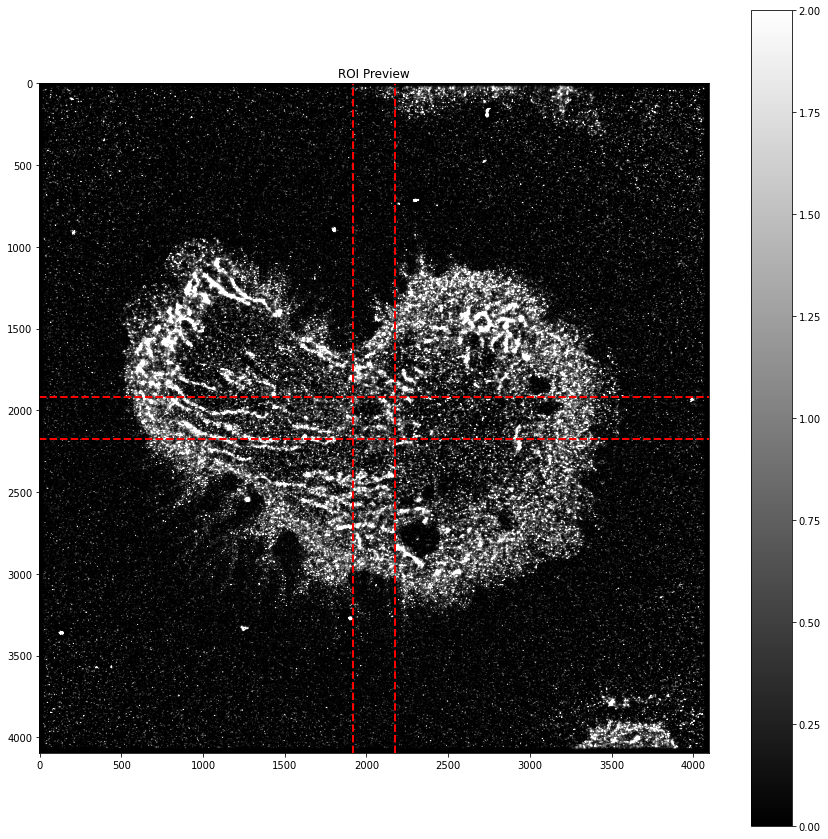

In [132]:
cropped_data = random_crops_max_roi(data, crop_size = (256,256), roi=(1920, 1920, 2176, 2176), vmin = 0, vmax = 2)

In [133]:
cropped_data.shape

(1, 256, 256)

In [131]:
plt.figure(figsize=(15 , 15)) 
plt.imshow(cropped_data[8], vmin=0, vmax=5, cmap='gray') #[1000:1200,450:700]

IndexError: index 8 is out of bounds for axis 0 with size 1

<Figure size 1080x1080 with 0 Axes>

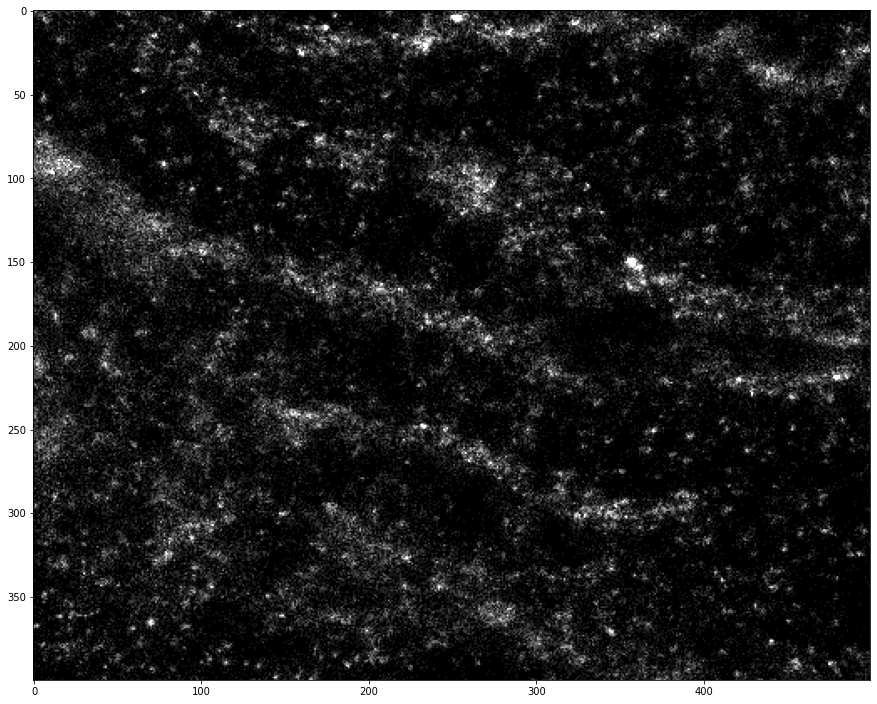

In [67]:
plt.figure(figsize=(15 , 15)) 
plt.imshow(histogram[0][1000*2:1200*2,450*2:700*2], vmin=0, vmax=10, cmap='gray') #[1000:1200,450:700]

In [85]:
def psnrToString(inp):
    if inp < 0:
        return 'm'+str(-inp)
    else:
        return str(inp)

# we set the pseudo PSNR range used for splitting the images into input and target
minpsnr = -40
maxpsnr = -5

name = psnrToString(minpsnr)+"to"+psnrToString(maxpsnr)+"-256x256"
CHECKPOINT_PATH = './models/'




In [78]:
BinomDataset?

Init signature:
BinomDataset(
    data,
    windowSize,
    minPSNR,
    maxPSNR,
    virtSize=None,
    augment=True,
    maxProb=0.99,
)
Docstring:     
Returns a BinomDataset that will randomly split an image into input and target using a binomial distribution for each pixel.
        
        Parameters:
                data (numpy array): a 3D numpy array (image_index, y, x) with integer photon counts. 
                windowSize (int): size of window to be used in random crops
                minPSNR (float): minimum pseudo PSNR of sampled data (see supplement)
                maxPSNR (float): maximum pseudo PSNR of sampled data (see supplement)
                virtSize (int): virtual size of dataset (default is None, i.e., the real size)
                augment (bool): use 8-fold data augmentation (default is False) 
                maxProb (float): the maximum success probability for binomial splitting
        Returns:
                dataset
File:           ~/GAP_for_localizati

In [71]:
maxepochs = 5 # train longer for better results

# Create pytorch dataset
dataset = BinomDataset(data[:round(data.shape[0]*0.9)], 256, minpsnr, maxpsnr, virtSize = 500*32)
val_dataset = BinomDataset(data[round(data.shape[0]*0.9):], 256, minpsnr, maxpsnr)

# Create pytorch dataloader for training and validation sets
train_loader = dt.DataLoader(dataset, batch_size=32, shuffle=True, drop_last=True, pin_memory=False, num_workers=12)
val_loader = dt.DataLoader(val_dataset, batch_size=32, shuffle=False, drop_last=False,  pin_memory=False, num_workers=12)

img =  next(iter(val_loader))

print(img.shape)


trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     gpus = [0], devices = [0],
                     max_epochs=maxepochs, 
                     callbacks=[ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=2000)])

model = UN(channels = 1, levels=10, depth=6,
                 start_filts=28, up_mode = 'transpose').to(device)

AttributeError: 'tuple' object has no attribute 'shape'

In [8]:
trainer.fit(model, train_loader, val_loader)
trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]

  | Name       | Type       | Params
------------------------------------------
0 | conv_final | Conv2d     | 29    
1 | down_convs | ModuleList | 24.1 M
2 | up_convs   | ModuleList | 9.4 M 
------------------------------------------
33.4 M    Trainable params
0         Non-trainable params
33.4 M    Total params
133.774   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

# Denoising

In [50]:
model = UN.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

In [9]:
dataTest = imread('./data/testData.tif')[:1]     # to speed things up, we are only doing the first image
dataTestGT =imread('./data/testDataGT.tif')[:1]
dataTest.shape

(1, 512, 512)

332 0 44.3373404001294 272.0 17.0


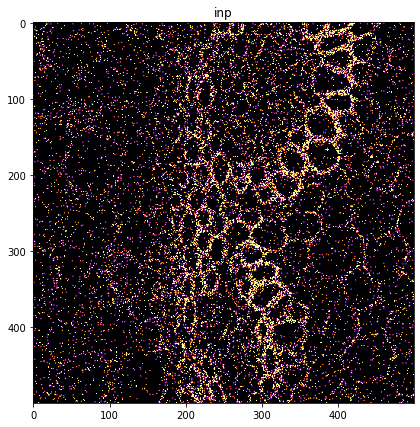

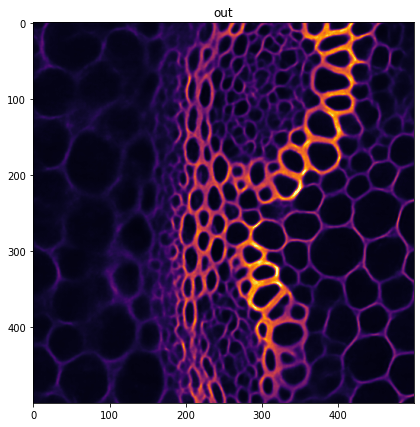

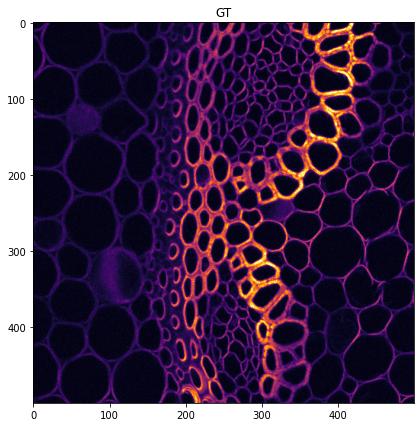

In [10]:
outputs = []
for inp, gt in zip(dataTest, dataTestGT):  
    inpT = torch.from_numpy(inp.astype(np.float32)).to(device)
    # We have to apply softmax over pixels
    out = torch.exp(model(inpT[None,None,...]).detach().cpu())
    out = inp.sum() * out / out.sum()
    outputs.append(out.numpy()[0,0])
    
    print(gt.max(), gt.min(), gt.std(), np.percentile(gt,99.9), np.percentile(gt,50))
    
    inp = inp/inp.mean()
    out = out/out.mean()
    gt = gt/gt.mean()
    vmax = np.percentile(gt,99.9)
    
    plt.figure(figsize=(7,7))
    plt.imshow(inp[:500,:500],vmin = 0, vmax = vmax, cmap = "inferno")
    plt.title('inp')
    plt.show()
    
    plt.figure(figsize=(7,7))
    plt.imshow(out[0,0][:500,:500],vmin = 0,vmax = vmax, cmap = "inferno")
    plt.title('out')
    plt.show()
    
    plt.figure(figsize=(7,7))
    plt.imshow(gt[:500,:500],vmin = 0,vmax = vmax, cmap = "inferno")
    plt.title('GT')
    plt.show()


In [11]:
outputs = np.array(outputs)
imsave('data/output.tif',outputs, imagej = True)

# Sampling images

(1, 1, 256, 256)


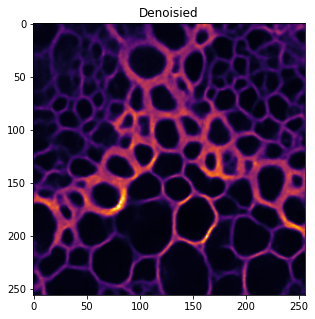

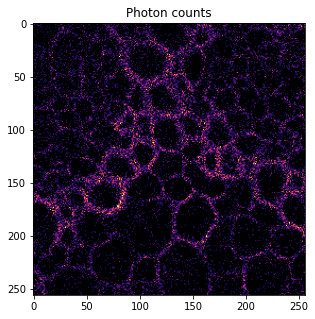

_______________________________________ 154
time (s): 0.8993678092956543 time per image (s) 0.8993678092956543


In [37]:
import matplotlib.image as mpimg
import time
import numpy as np

# We are starting with an image containing zeros,
# i.e., sampling from scratch

# we just have 1 channel
channels = 1
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 256
pixels_y = 256

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x).to(device)


for i in range(1):
    

    startTime = time.time()
    
    # sampling the image(s)
    denoised, photons, stack, iterations = sample_image(inp_img,
                                                        model, 
                                                        beta = 0.05,
                                                        save_every_n = 10,
                                                        max_psnr = -5)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):
#         print(iterations)

            print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(denoised[j,0], cmap='inferno', vmin = 0,
                       vmax = np.percentile(denoised[j],99.99))
            plt.title('Denoisied')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(photons[j,0], cmap='inferno', vmin = 0,
                       vmax = np.percentile(photons[j],99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    
    
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print ('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])
   

## Looking at the intermediate outputs

0


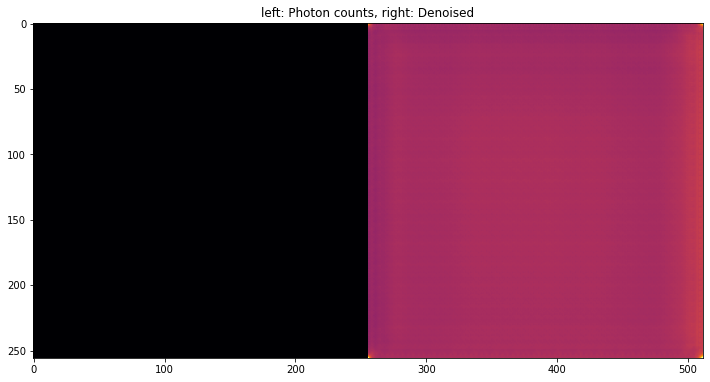

1


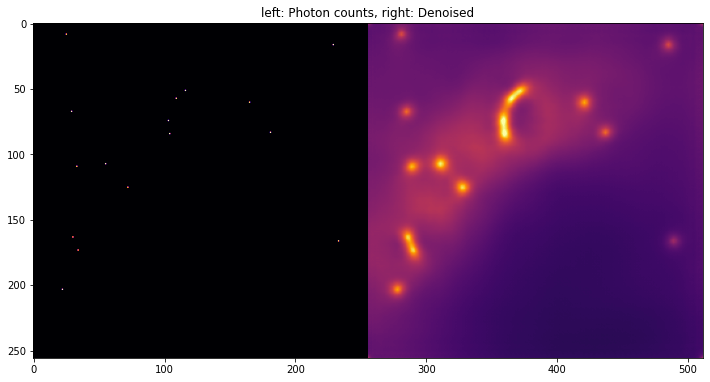

2


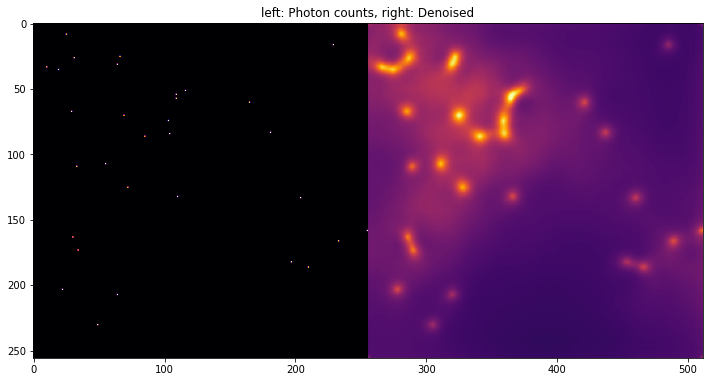

3


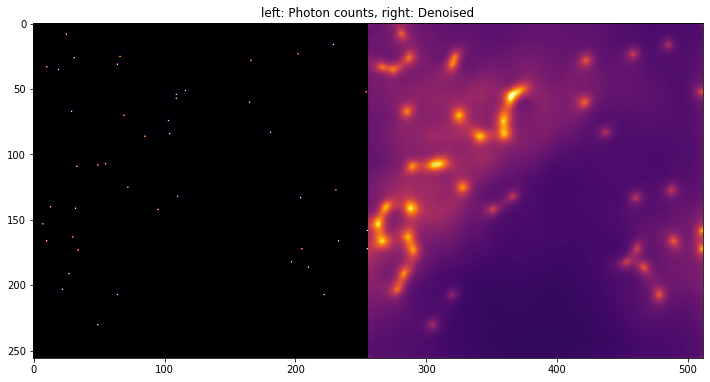

4


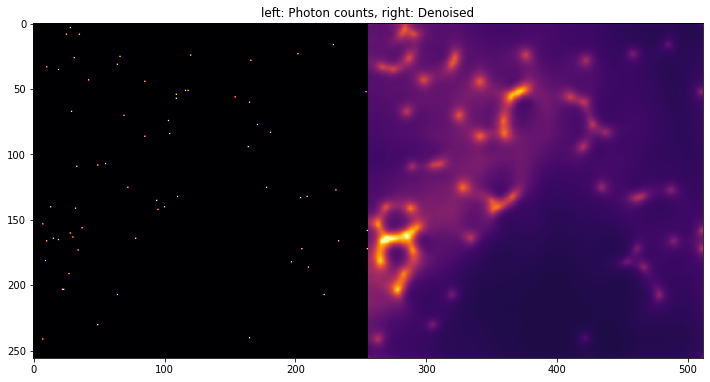

5


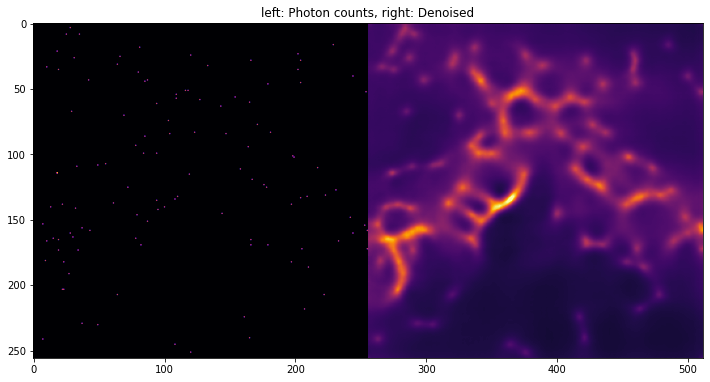

6


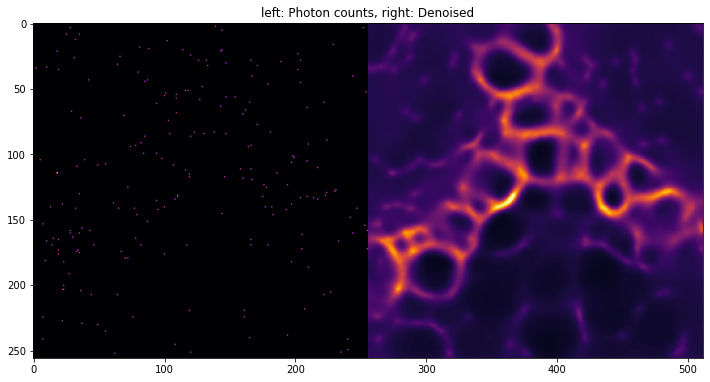

7


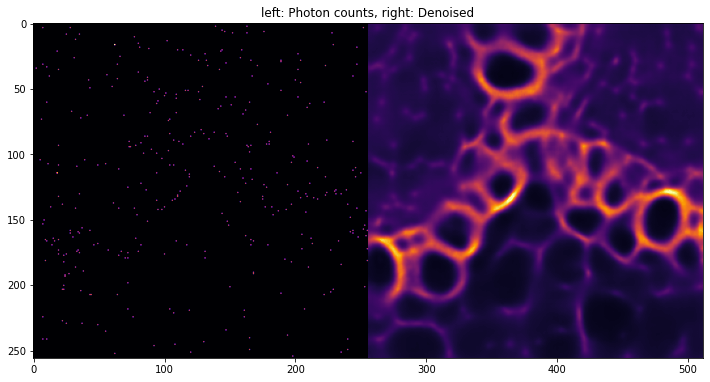

8


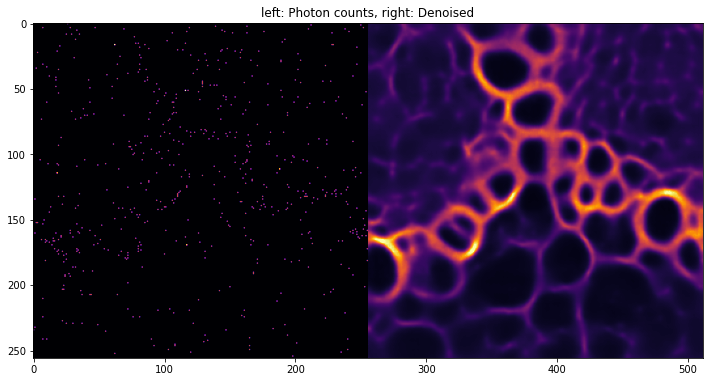

9


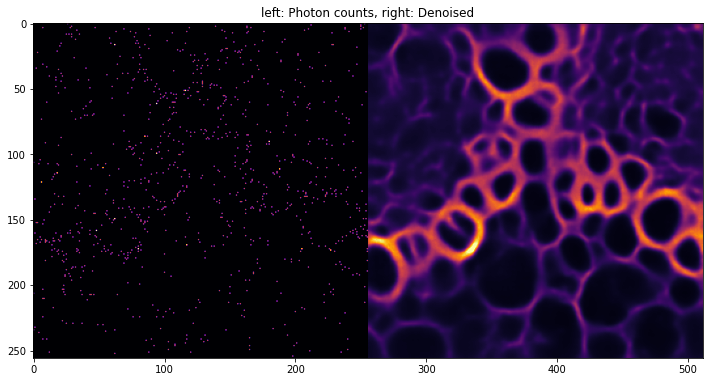

10


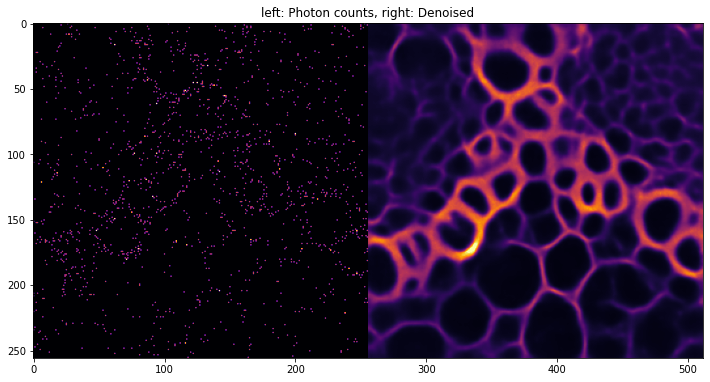

11


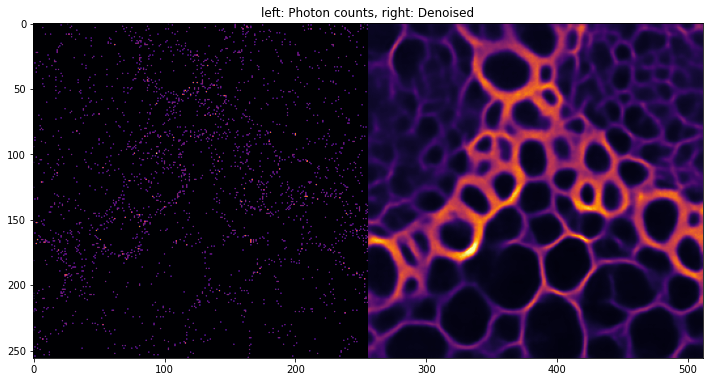

12


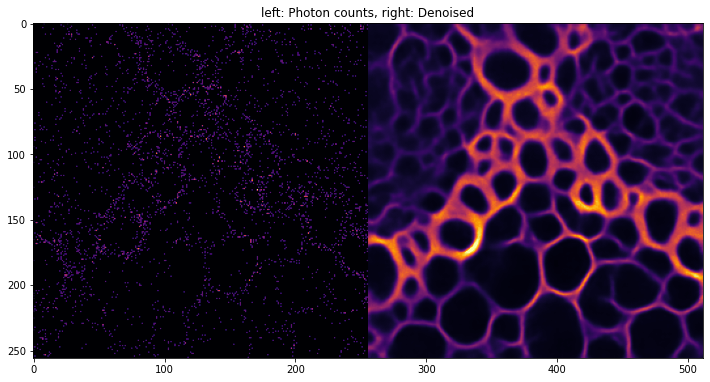

13


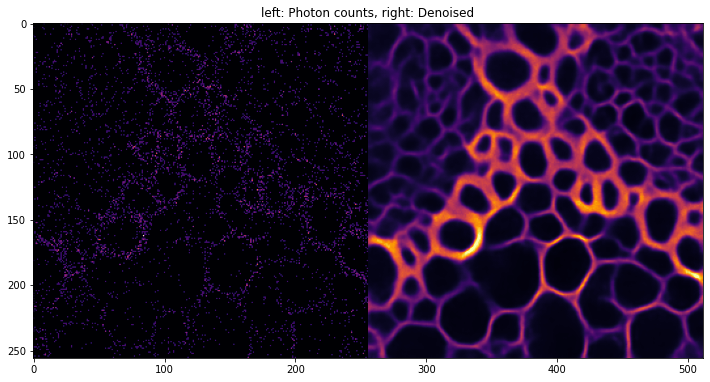

14


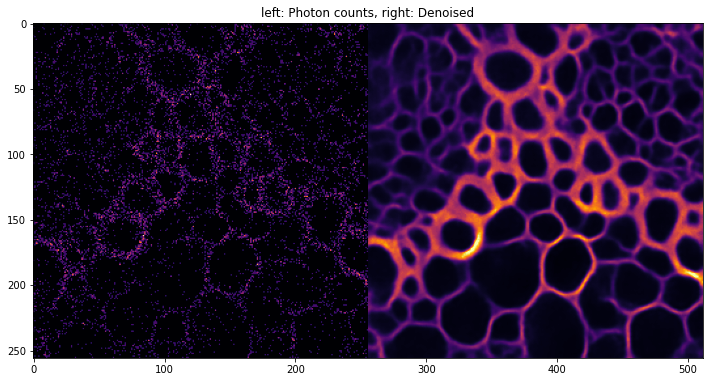

15


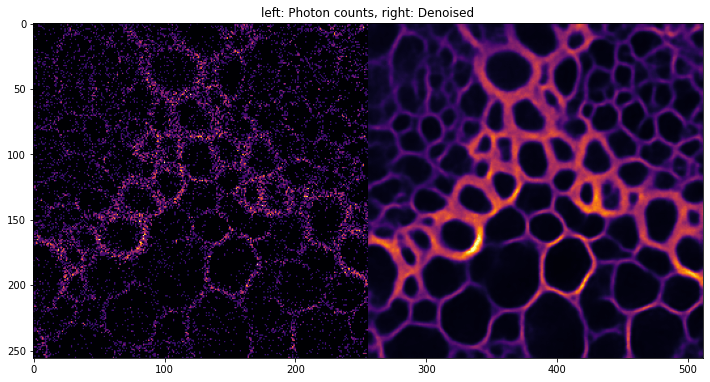

In [38]:
stack[0].shape
for i in range(len(stack)):
    im = stack[i]
    print(i)
    plt.figure(figsize = (12,12))
    plt.imshow(im,cmap ='inferno', vmax = 0.9)
    plt.title('left: Photon counts, right: Denoised')
    plt.show()